## STAT 477 FINAL PROJECT
Megha Raman

# 1. Summary, background, value proposition (20%)


## Summary of results:

**A. Define your audience/stakeholders**

The audience and stakeholders of this data project include, and are not limited to NCAA players, coaches, viewers and recruiters. As a lot of this data is player and/or team data, it can be useful for players and coaches to get a sense of what historical data is on their team. Much like rewatching plays, there is a lot to learn from the data itself. As for viewers, many viewers are excited about the stats that come along witht their favorite teams and players. Moreover, there is a lot of hype around predicting march madness brackets with increasing accuracy.

**B. Describe the phenomenon that you are about to analyze**

In this project, I am analyzing different team level data, as well as play by play data to see if there are any patterns. This data project will primarily work with the NCAA google big query data set, and also FiveThirtyEight rankings and another data set on team stats from kaggle. Specifically I am looking at the play by play data table in which each row represents a different play in the game, how it ended, what points were scored, etc from 2013 to 2017. I would like to get a sense of what shots are more popular, have they changed over time, and also if during the game there is a more common time to be playing a certain kind of play. I am also looking at the historic tournament games and games datasets but for further analysis. For future plays done by the NCAA teams, I think it would be fascinating to get a sense of how historic data might influence these plays. Using this data, and potentially more current data, I want to create a simple model to predict march madness outcomes for the 2023 year. I would also like to create unique ways of visualizing some of this data that might be beneficial for its stakeholders. this data is important to stakeholders (NCAA players, viewers, coaches, and recruiters) as they try to identify weaknesses in their plays, strategies that historically have worked, and for viewers, who to root for. 


**C. Provide a high-level summary of your conclusions**

First, looking at the data visualizations, I identified interesting correlations between numeric variables. Specifically between the Seed of each year, BARTHAG, the likelihood to defeat a average D1 team, and 538 rating, a rating created by a basketball data organization that combines many different metrics. Utilizing these three, I created a simple linear regression to identify any overlap. Then, I created a clustering model using two methods, both producing that 2 clusters appears to be the optimal value, and it seems to separate on an average of different numerical metrics for the different teams.

**D. Transparently characterize the limitations of your approach**

- **a. What are we missing in this data?**

The biggest limitation is the amount of data that we have, and how to account for all of it. I ended up using in my regression model as well as the clustering model a smaller, team based dataset, because processing all of the individual play-by-by data would have taken much longer. Thus, I used a smaller subset of the larger play by play data to run my analysis. 

- **b. What alternative explanations are there for the patterns you’re describing or the claims you’re making?**

Mainly, the alternative explanation for the patterns I have identified is that there are confounding variables that make up the larger values that I am looking into. For example, seed, BARTHAG, and 538rating are all measurements of performance and thus would include similar inputs to finalize this metric.
    

## Value proposition:


**E. Make a strong argument for why it’s important to study this phenomenon**

It is important to study this data. Many things, including sports were put on hold during the pandemic and now that it is in full swing, there is a huge industry that is being revived. It is also interesting to look at how individual plays, team scoring, can effect these respective universities from a fiscal and monetary lens.



**F. Explain what the challenges are in studying it**

- **a. Why don’t we already know the answer?**

In some ways, these questions have been answered, but want to see if there are missing factors from traditional analysis that could be brought into play. Moreover, a lot of the big query data is outdated, and thus needed to be supplemented by other data, to ensure a robust analysis.

- **b. What are the barriers to entry that have prevented/will prevent competitors from doing exactly the same thing?**

Mainly the processing time of understanding the different data sets. Google Big Query is difficult to mine through, and is labor intensive. Moreover, there are more qualitative ways that these stakeholders in the interim can use  instead of hard, big data.

## Background:

**G. Map the data landscape, categorizing information as follows:**
- **a. Data that you know exists**
Team statistics yearly, Play by play data from 2013-2017. Arena and location data
- **b. Data that might exist** 
Coach specific statistics on a year by year basis as well as "career statistics"
- **c. Data that probably doesn’t exist but would be useful**
Change data: essentially how teams change in their performance from year to year. While this is moderately able to be calculated from these data sets, it would be interesting to get a full synthesis of how team composition, statistics, and other factors are changing year to year.

**H. Situate the phenomenon of interest within this landscape**
- **a. Describe a day in the life of a data point: follow it backward and forward**
For example, the play by play data exists for perhaps a fraction of a second. It is added to a big query data, where it is synthesized and processed to create models and visualizations. 
- **b. Identify important stages in this process and important concepts in each stage, regardless of whether or not data exists for them**
Collection, Processing, Visualization, Modeling are the key process steps that the data point will go through in its lifetime. For collection, identifying the most efficient way to measure each kind of data is import. For processing, depending on how cleanly you can acquire data, this process can be much more laborious. Visualization can come in many different forms, but is the key step to communication of these processes. Lastly, modeling takes the granular data and puts it into perspective with thousands, millions, or even billion other data points like it. 

# 2. Data acquisition, preprocessing (10%)

## Data Acquisition

**Datasets used:**
- bigquery-public-data.ncaa_basketball.mbb_pbp_sr

- https://www.kaggle.com/datasets/raddar/ncaa-men-538-team-ratings

- https://www.kaggle.com/datasets/andrewsundberg/college-basketball-dataset


**Data set 1: NCAA GBQ**
- **Columns not of interest**
    - `load_timestamp`: does not serve much of a purpose, date of game is more usefull
    - `venue_id`, `venue_address`, `venue_zip`, `venue country`: there are other column values that indicate venue that are more descriptive than the id, and exact address. for visualization, might be helpful to bring in other geographic data
    - `status`: most are closed anyway, does not tell much about the game
    - `possession_team_id`, `player_id`, `player_full_name`,`jersey_num`: do not need player level information for current analysis
- **Columns of interest**
    - `game id`: (obj) unique identifier of game for each play 
    - `season`: (int) aka year of game
    - `venue_city`, `venue_state`: (obj) venue city and state of game of each play
    - `attendance`: (int) number of people in arena
    - `event_type` (obj): type of play, rebounds, twopointmade, threepointmade, etc
    - `type` (obj): type of shot
    - `away_alias` `home_alias` `home_conf_alias` `away_conf_alias` (obj): alias, or shorthand of both home and away team name and conference they are a part of
    - `event_coord_x`,`event_coord_y` (obj) coordinate of shot/rebound on the court
    - `shot_made`, `shot_type`, `three_point_shot` (obj) information about the shot, if taken, what type and whether or not it was a three pointer


<!-- scheduled_date
conference_game
tournament
tournament_type
round
period
game_clock
elapsed_time_sec
event_description -->


**Dataset 2: Merged NCAA performance data**
- **Columns of interest**
    - `Number of games played/won`: can see how many games are played total and how many of those are won
    - `ADJOE/ADJDE`: Adjusted Offensive Efficiency/Adjusted Defensive Efficiency:metric to assess efficiency of a team
    - `BARTHAG`: Power Rating (Chance of beating an average Division I team)
    - `EFG_O`: Effective Field Goal Percentage Shot
    - `EFG_D`: Effective Field Goal Percentage Allowed
    - `TOR`: Turnover Percentage Allowed (Turnover Rate)
    - `TORD`: Turnover Percentage Committed (Steal Rate)
    - `ORB`: Offensive Rebound Rate
    - `DRB`: Offensive Rebound Rate Allowed
    - `FTR` : Free Throw Rate (How often the given team shoots Free Throws)
    - `FTRD`: Free Throw Rate Allowed
    - `2P_O`: Two-Point Shooting Percentage
    - `2P_D`: Two-Point Shooting Percentage Allowed
    - `3P_O`: Three-Point Shooting Percentage
    - `3P_D`: Three-Point Shooting Percentage Allowed
    - `538rating`: FiveThirtyEight (https://fivethirtyeight.com/) is a  tool to track NCAA March Madness. Since 2016 it has shared its own team rankings.

## Data Preprocessing

**Data Cleaning Overview:**

I did the majority of the calling through SQL but here is some data cleaning I would do with the pandas data frame that i might use later. Moreover, a lot of variables, since it is a google data, are already clean. For the other data sets, they were pretty small, and did not need much cleaning. Later on, I removed the nonnumerical columns for clustering and removed the null values, but for the data visualization, I kept all the values in the data frame. 

In [1]:
# display output from every line without explicit print()
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [2]:
#imports for entire project
import pathlib
import pandas as pd
import plotnine as pn
import pandas_gbq
import matplotlib.pyplot as plt
import numpy as np
import sklearn.cluster
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import patsy
import statsmodels.api as sm

In [3]:
#setting display as max to see all rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [4]:
#inputting first data set, and creating dataframe
query1 = \
'''
SELECT 
    *
FROM 
    `bigquery-public-data.ncaa_basketball.mbb_pbp_sr`
WHERE
  home_division_alias = "D1"
  AND away_division_alias = "D1"
LIMIT 500
'''

In [5]:
mbb_pbp_df = pd.read_gbq(query1, project_id = 'stat477finalproject')
mbb_pbp_df.head(10)

,game_id,load_timestamp,season,status,scheduled_date,venue_id,venue_name,venue_city,venue_state,venue_address,venue_zip,venue_country,venue_capacity,attendance,neutral_site,conference_game,tournament,tournament_type,round,game_no,away_market,away_name,away_id,away_alias,away_conf_name,away_conf_alias,away_division_name,away_division_alias,away_league_name,home_market,home_name,home_id,home_alias,home_conf_name,home_conf_alias,home_division_name,home_division_alias,home_league_name,period,game_clock,elapsed_time_sec,possession_arrow,team_name,team_market,team_id,team_alias,team_conf_name,team_conf_alias,team_division_name,team_division_alias,team_league_name,team_basket,possession_team_id,player_id,player_full_name,jersey_num,event_id,timestamp,event_description,event_coord_x,event_coord_y,event_type,type,shot_made,shot_type,shot_subtype,three_point_shot,points_scored,turnover_type,rebound_type,timeout_duration
0,d20765db-ba7f-4278-bad6-e1604c9bc0f0,2018-04-01 03:25:00+00:00,2017,closed,2018-04-01 00:49:00+00:00,290e189d-f189-4c81-b4d8-8bf3221d075b,Alamodome,San Antonio,TX,100 Montana Street,78203,USA,39500,68257,True,False,NCAA,Final Four,Semifinals,Game 2,Kansas,Jayhawks,fae4855b-1b64-4b40-a632-9ed345e1e952,KU,Big 12,BIG12,NCAA Division I,D1,NCAA MEN,Villanova,Wildcats,4383eb6a-7fd8-4ff2-94c5-43c933121e88,VILL,Big East,BIGEAST,NCAA Division I,D1,NCAA MEN,1,14:21,339,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,None,None,None,None,None,None,None,None,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,0,a8567abd-6924-4aad-9c0e-735a0108c3e4,2018-04-01 01:07:00+00:00,TV timeout,NaN,NaN,tvtimeout,None,False,None,None,False,NaN,None,None,NaN
1,d20765db-ba7f-4278-bad6-e1604c9bc0f0,2018-04-01 03:25:00+00:00,2017,closed,2018-04-01 00:49:00+00:00,290e189d-f189-4c81-b4d8-8bf3221d075b,Alamodome,San Antonio,TX,100 Montana Street,78203,USA,39500,68257,True,False,NCAA,Final Four,Semifinals,Game 2,Kansas,Jayhawks,fae4855b-1b64-4b40-a632-9ed345e1e952,KU,Big 12,BIG12,NCAA Division I,D1,NCAA MEN,Villanova,Wildcats,4383eb6a-7fd8-4ff2-94c5-43c933121e88,VILL,Big East,BIGEAST,NCAA Division I,D1,NCAA MEN,1,2:57,1023,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,None,None,None,None,None,None,None,None,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,0,891d78d7-5b59-4318-b41a-694a181413d8,2018-04-01 01:36:00+00:00,TV timeout,NaN,NaN,tvtimeout,None,False,None,None,False,NaN,None,None,NaN
2,d20765db-ba7f-4278-bad6-e1604c9bc0f0,2018-04-01 03:25:00+00:00,2017,closed,2018-04-01 00:49:00+00:00,290e189d-f189-4c81-b4d8-8bf3221d075b,Alamodome,San Antonio,TX,100 Montana Street,78203,USA,39500,68257,True,False,NCAA,Final Four,Semifinals,Game 2,Kansas,Jayhawks,fae4855b-1b64-4b40-a632-9ed345e1e952,KU,Big 12,BIG12,NCAA Division I,D1,NCAA MEN,Villanova,Wildcats,4383eb6a-7fd8-4ff2-94c5-43c933121e88,VILL,Big East,BIGEAST,NCAA Division I,D1,NCAA MEN,1,6:52,788,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,None,None,None,None,None,None,None,None,fae4855b-1b64-4b40-a632-9ed345e1e952,None,None,0,d6c1ea43-e12f-4444-8219-77de3399d3ef,2018-04-01 01:27:00+00:00,TV timeout,NaN,NaN,tvtimeout,None,False,None,None,False,NaN,None,None,NaN
3,d20765db-ba7f-4278-bad6-e1604c9bc0f0,2018-04-01 03:25:00+00:00,2017,closed,2018-04-01 00:49:00+00:00,290e189d-f189-4c81-b4d8-8bf3221d075b,Alamodome,San Antonio,TX,100 Montana Street,78203,USA,39500,68257,True,False,NCAA,Final Four,Semifinals,Game 2,Kansas,Jayhawks,fae4855b-1b64-4b40-a632-9ed345e1e952,KU,Big 12,BIG12,NCAA Division I,D1,NCAA MEN,Villanova,Wildcats,4383eb6a-7fd8-4ff2-94c5-43c933121e88,VILL,Big East,BIGEAST,NCAA Division I,D1,NCAA MEN,2,11:58,1682,4383eb6a-7fd8-4ff2-94c5-43c933121e88,None,None,None,None,None,None,None,None,None,None,fae4855b-1b64-4b40-a632-9ed345e1e952,None,None,0,5493b955-65a4-4a91-8ec7-ce682e1caa5d,2018-04-01 02:22:00+00:00,TV timeout,NaN,NaN,tvtimeout,None,False,None,None,False,NaN,None,None,NaN
4,d20765db-ba7f-4278-bad6-e1604c9bc0f0,2018-04-01 03:25:00+00:00,2017,closed,2018-04-01 00:49:00+00:00,290e189d-f189-4c8

In [6]:
#inputting second and third data set
rating_path = pathlib.Path('Downloads/538ratingsMen.csv')
cbb_path = pathlib.Path('Downloads/cbb.csv')

In [7]:
rating_df = pd.read_csv(rating_path)
cbb_df = pd.read_csv(cbb_path)

In [8]:
for col in mbb_pbp_df.columns:
    print(col)

game_id
load_timestamp
season
status
scheduled_date
venue_id
venue_name
venue_city
venue_state
venue_address
venue_zip
venue_country
venue_capacity
attendance
neutral_site
conference_game
tournament
tournament_type
round
game_no
away_market
away_name
away_id
away_alias
away_conf_name
away_conf_alias
away_division_name
away_division_alias
away_league_name
home_market
home_name
home_id
home_alias
home_conf_name
home_conf_alias
home_division_name
home_division_alias
home_league_name
period
game_clock
elapsed_time_sec
possession_arrow
team_name
team_market
team_id
team_alias
team_conf_name
team_conf_alias
team_division_name
team_division_alias
team_league_name
team_basket
possession_team_id
player_id
player_full_name
jersey_num
event_id
timestamp
event_description
event_coord_x
event_coord_y
event_type
type
shot_made
shot_type
shot_subtype
three_point_shot
points_scored
turnover_type
rebound_type
timeout_duration


In [9]:
#dropping unnecessary columns
mbb_pbp_df = mbb_pbp_df.drop(columns=['load_timestamp', 'venue_id', 'venue_address', 
                         'venue_zip','venue_country', 'status', 'possession_team_id', 
                         'player_id', 'player_full_name', 'jersey_num' ])

In [10]:
#merging second and third data sets
cbb_df = cbb_df.merge(rating_df, how = 'left', left_on=['TEAM', 'YEAR'], 
                      right_on = ['TeamName', 'Season'])

In [11]:
#rename column
cbb_df = cbb_df.rename(columns={"538rating": "rating"})

# 3. Data visualization (25%)

In this section, I wanted to isolate interesting variables in each of the datasets I collected. Overall, finding patterns in this data allowed me to understand what exactly would be interesting enough to run a regression, or other data analyses processes to better understand trends in the datasets.

,scheduled_date,name,alias,team_points,opp_name,opp_alias,opposing_team_points,point_total
0,2017-02-10,Terriers,WOF,131,Bulldogs,SAM,127,258
1,2017-02-10,Bulldogs,SAM,127,Terriers,WOF,131,258
2,2017-02-04,Vikings,PRST,124,Eagles,EWU,130,254
3,2017-02-04,Eagles,EWU,130,Vikings,PRST,124,254
4,2013-11-14,Crusaders,HC,122,Pioneers,SHU,118,240


<AxesSubplot:title={'center':'Highest scoring games were over 250 points total with both teams'}, xlabel='name'>

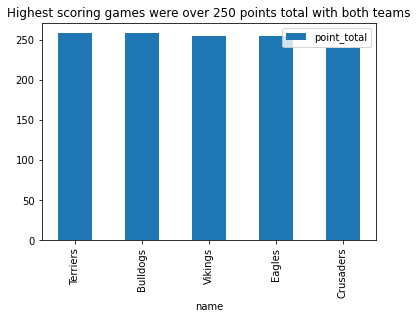

In [12]:
# Viz 1
query_points = '''
SELECT
  scheduled_date,
  name,
  alias,
  points_game AS team_points,
  opp_name,
  opp_alias,
  opp_points_game AS opposing_team_points,
  points_game + opp_points_game AS point_total
FROM `bigquery-public-data.ncaa_basketball.mbb_teams_games_sr`
WHERE season > 2010
ORDER BY point_total DESC
LIMIT 5;
'''

points_graph = pd.read_gbq(query_points, project_id = 'stat477finalproject')
points_graph
points_graph.plot.bar(x = 'name', y = 'point_total', title = 'Highest scoring games were over 250 points total with both teams')

This first graph shows the highest scoring games by points total. It appears that the top 3 games had over 250 points scored between the teams. What is interesting, is that these top games are fairly close in point numbers, there is no runaway from one team.

,scheduled_date,name,market,alias,team_points,opp_name,opp_market,opp_alias,opposing_team_points,point_difference
0,2018-04-03,Wildcats,Villanova,VILL,79,Wolverines,Michigan,MICH,62,17
1,2018-04-03,Wolverines,Michigan,MICH,62,Wildcats,Villanova,VILL,79,17
2,2017-04-04,Bulldogs,Gonzaga,GONZ,65,Tar Heels,North Carolina,UNC,71,6
3,2017-04-04,Tar Heels,North Carolina,UNC,71,Bulldogs,Gonzaga,GONZ,65,6


<AxesSubplot:title={'center':'The highest point difference in a champtionship was 17'}, xlabel='name'>

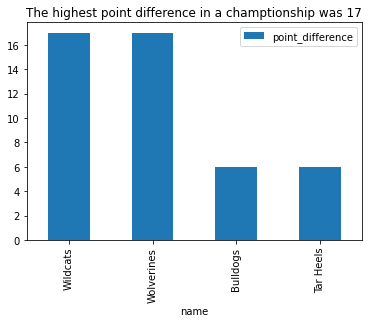

In [13]:
# Viz 2
query_nat_champ = '''
SELECT
  scheduled_date,
  name,
  market,
  alias,
  points_game AS team_points,
  opp_name,
  opp_market,
  opp_alias,
  opp_points_game AS opposing_team_points,
  ABS(points_game - opp_points_game) AS point_difference
FROM `bigquery-public-data.ncaa_basketball.mbb_teams_games_sr`
WHERE season > 2015 AND tournament_type = 'National Championship'
ORDER BY point_difference DESC
LIMIT 5;
'''
champ_graph = pd.read_gbq(query_nat_champ, project_id = 'stat477finalproject')
champ_graph
champ_graph.plot.bar(x = 'name', y = 'point_difference', title = 'The highest point difference in a champtionship was 17')

Similarly, in this second graph, I wanted to identify the highest point difference. Notice that one of the games has an overlap between the highest scoring game and the highest point difference in a championship. The highest point difference, being 17. considering that is anywhere from 5-10 shots of a difference, it makes the pace of these games really stand out

,0
threes_made_first10,77998
threes_att_first10,224103
threes_made_last10,37540
threes_att_last10,114394


<AxesSubplot:title={'center':'There are more 3s attempted and made in the first 20 than in the last 20'}>

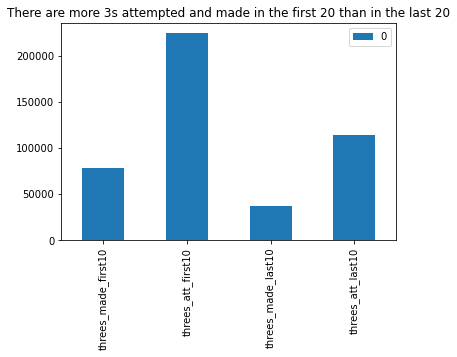

In [14]:
# Viz 3
query3 = '''
SELECT
  #first 20 minutes of regulation
  COUNTIF(event_type = "threepointmade"
    AND elapsed_time_sec < 1200) AS threes_made_first10,
  COUNTIF((event_type = "threepointmade"
      OR event_type = "threepointmiss")
    AND elapsed_time_sec < 1200) AS threes_att_first10,
  #last ten minutes of regulation
  COUNTIF(event_type = "threepointmade"
    AND elapsed_time_sec >= 1800) AS threes_made_last10,
  COUNTIF((event_type = "threepointmade"
      OR event_type = "threepointmiss")
    AND elapsed_time_sec >= 1800) AS threes_att_last10,
FROM
  `bigquery-public-data.ncaa_basketball.mbb_pbp_sr`
WHERE
  home_division_alias = "D1"
  AND away_division_alias = "D1"
'''
three_df = pd.read_gbq(query3, project_id = 'stat477finalproject')
three_df = three_df.T
three_df
three_df.plot.bar(title = 'There are more 3s attempted and made in the first 20 than in the last 20')

# plot = pn.ggplot(data=three_df)

# plot = (plot+
#         pn.geom_bar() +
#         pn.ylab('Number of Shots') +
#         pn.xlab('Type of Shot') +
#         pn.ggtitle('Players are much more likely to attempt shots at the first part of the game')              
# )
# plot

#   COUNTIF(event_type = "threepointmade"
#     AND elapsed_time_sec < 1800) / COUNTIF((event_type = "threepointmade"
#       OR event_type = "threepointmiss")
#     AND elapsed_time_sec < 1800) AS three_pt_pct_first30,
#   COUNTIF(event_type = "threepointmade"
#     AND elapsed_time_sec >= 1800) / COUNTIF((event_type = "threepointmade"
#       OR event_type = "threepointmiss")
#     AND elapsed_time_sec >= 1800) AS three_pt_pct_last10

This graph is interesting. In the first 20 minutes of the game, there is significantly more threes attemped and made than in the last 20 minutes, probably due to a decrease in risk aversion throughout the game.

,venue_name,venue_capacity,venue_city,venue_state
0,AT&T Stadium,80000,Arlington,TX
1,University of Phoenix Stadium,72220,Glendale,AZ
2,NRG Stadium,71054,Houston,TX
3,Georgia Dome,71000,Atlanta,GA
4,Lucas Oil Stadium,70000,Indianapolis,IN


<AxesSubplot:title={'center':'Top 5 Biggest Stadiums'}, xlabel='venue_name'>

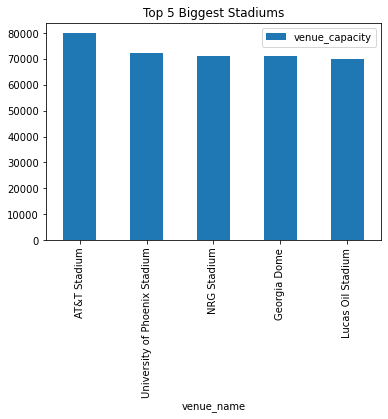

In [15]:
# Viz 4
query_venue = '''
SELECT
  venue_name, venue_capacity, venue_city, venue_state
FROM `bigquery-public-data.ncaa_basketball.mbb_teams_games_sr`
GROUP BY 1,2,3,4
ORDER BY venue_capacity DESC
LIMIT 5;
'''

venue_df = pd.read_gbq(query_venue, project_id = 'stat477finalproject')
venue_df
venue_df.plot.bar(x = 'venue_name', y = 'venue_capacity', title = 'Top 5 Biggest Stadiums')

# plot = pn.ggplot(data=venue_df, mapping = pn.aes(x='venue_name',
#                                               y = 'venue_capacity') +
#                  pn.theme(axis_text_x = pn.element_text(angle = 45, hjust = 1)) +
#                  pn.ylab('Venue Name') + pn.xlab('Capacity') + pn.ggtitle('Top 5 Biggest Stadiums') + pn.geom_bar()
# )
# plot

I wanted to incorporate some of the stadium information. The AT&T Stadium in Arlington, Texas, The University of Phoenix Stadium in Glendale, Arizona, the NRG Stadium in Houston, Texas, the Georgia Dome in Atlanta, GA and Lucas Oil Stadium	in Indianapolis, IN are teh largest stadiums with over 70,000 occupants. Texas is home to two of the largest.

,scheduled_date,name,three_points_att,three_points_made,three_points_pct,opp_name,opp_three_points_att,opp_three_points_made,opp_three_points_pct,total_threes
0,2016-11-18,Knights,38,16,42.1,Tigers,52,24,46.2,40
1,2016-11-18,Tigers,52,24,46.2,Knights,38,16,42.1,40
2,2016-11-22,Wildcats,39,14,35.9,Tigers,45,23,51.1,37
3,2016-11-22,Tigers,45,23,51.1,Wildcats,39,14,35.9,37
4,2017-12-10,Cougars,51,21,41.2,Skyhawks,35,15,42.9,36


<AxesSubplot:title={'center':'The most total number of 3 pointers made is 40'}, xlabel='scheduled_date'>

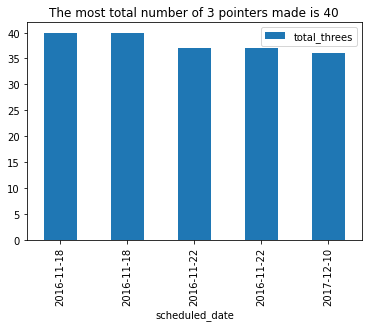

In [16]:
# Viz 5
q_total_3 = '''
SELECT
  scheduled_date,
  name,
  three_points_att,
  three_points_made,
  three_points_pct,
  opp_name,
  opp_three_points_att,
  opp_three_points_made,
  opp_three_points_pct,
  (three_points_made + opp_three_points_made) AS total_threes
FROM `bigquery-public-data.ncaa_basketball.mbb_teams_games_sr`
WHERE season > 2010
ORDER BY total_threes DESC
LIMIT 5;
'''

total_df = pd.read_gbq(q_total_3, project_id = 'stat477finalproject')
total_df
total_df.plot.bar(x = 'scheduled_date', y = 'total_threes', title ='The most total number of 3 pointers made is 40')

In this graph, you can see the games with the highest number of 3 pointers made total by both teams. The Tigers appear twice in 2016, with the first having a total of 40 3 pointers made and the second with a total of 37.

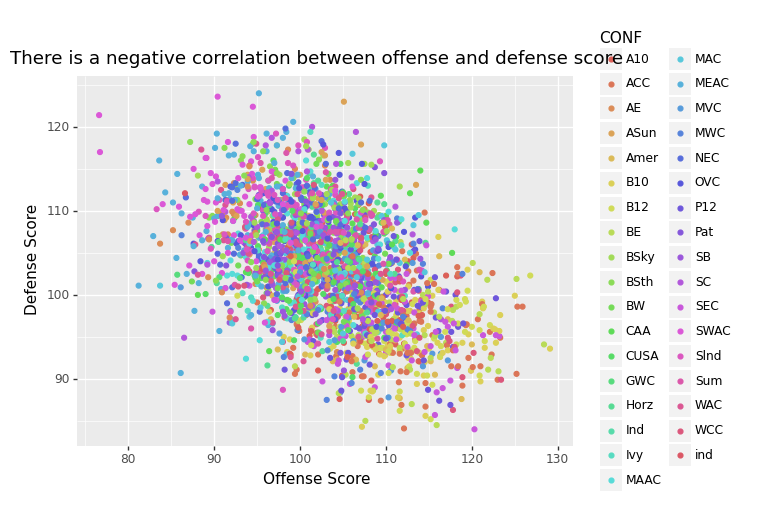

<ggplot: (8781985342699)>

In [17]:
# Viz 6
plot = pn.ggplot(data=cbb_df, mapping = pn.aes(x='ADJOE',
                                              y = 'ADJDE', color = 'CONF'))
plot = (plot +
        pn.geom_point() +
        pn.ylab('Defense Score') +
        pn.xlab('Offense Score') +
        pn.ggtitle('There is a negative correlation between offense and defense score')      
)
plot


# plot = plot + pn.facet_wrap('title', ncol=3)
# plot = plot + pn.theme(axis_text_x = pn.element_text(angle = 45, hjust = 1))
# plot = plot + pn.theme(figure_size=(30,27))

In this graph, I utilized the Offensive and Defensive score of each team, and color coordinated with the conference they belong to. It appears that there is a slight downward slope in this larger scatter plot. This means that the defensive and offensive scores for teams are negatively correlated and teams are often better at one or the other.

/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 1979 rows containing missing values.


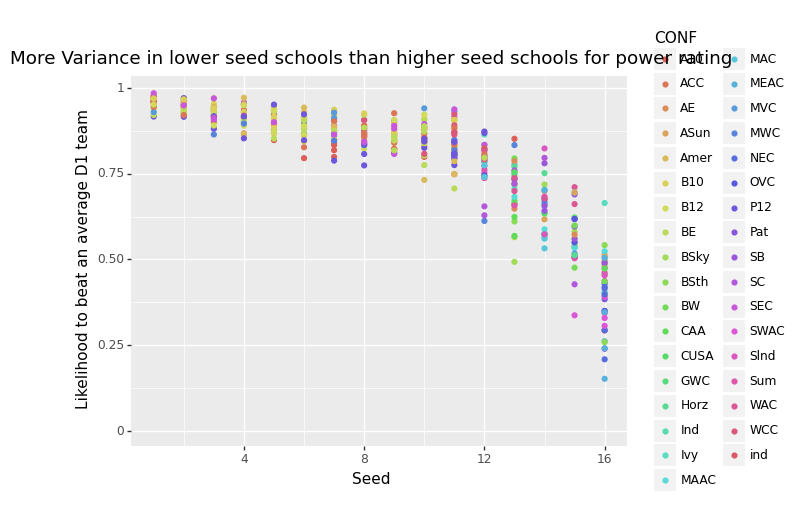

<ggplot: (8781985098882)>

In [18]:
# Viz 7
plot = pn.ggplot(data=cbb_df, mapping = pn.aes(x='SEED',
                                              y = 'BARTHAG', color = 'CONF'))
plot = (plot +
        pn.geom_point() +
        pn.ylab('Likelihood to beat an average D1 team') +
        pn.xlab('Seed') +
        pn.ggtitle('More Variance in lower seed schools than higher seed schools for power rating')      
)
plot

This is a graph of the seed of each school, and teh likelihood of that school to beat an average D1 team, (the BARTHAG score). This is obviously negatively correlated in that a higher seed must mean that they are more likely to beat another team. 

In [19]:
# Viz 8
query_event = '''
SELECT
  event_type,
  COUNT(*) AS event_count
FROM `bigquery-public-data.ncaa_basketball.mbb_pbp_sr`
GROUP BY 1
ORDER BY event_count DESC;
'''

event_graph = pd.read_gbq(query_event, project_id = 'stat477finalproject')

event_graph

,event_type,event_count
0,rebound,790490
1,twopointmiss,425422
2,turnover,410166
3,twopointmade,400648
4,freethrowmade,316637
5,assist,293403
6,threepointmiss,291935
7,personalfoul,243613
8,shootingfoul,183541
9,threepointmade,153967


In [20]:
# Viz 9
query_event = '''
SELECT
  event_type
FROM `bigquery-public-data.ncaa_basketball.mbb_pbp_sr`
LIMIT 100;
'''

event_graph = pd.read_gbq(query_event, project_id = 'stat477finalproject')
event_graph

,event_type
0,tvtimeout
1,tvtimeout
2,tvtimeout
3,tvtimeout
4,tvtimeout
5,tvtimeout
6,tvtimeout
7,review
8,endperiod
9,endperiod


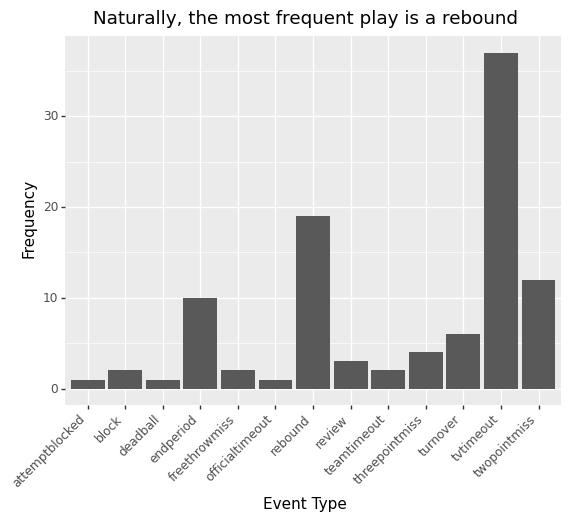

<ggplot: (8781985833813)>

In [21]:
pn.ggplot(event_graph) + pn.geom_bar(pn.aes(x='event_type')) + pn.theme(axis_text_x = pn.element_text(angle = 45, hjust = 1)) + pn.ylab('Frequency') + pn.xlab('Event Type')+ pn.ggtitle('Naturally, the most frequent play is a rebound')

In this plot, I have each event type (i.e, what each play is categorized by) on the x axis, and the frequency on the y axis. It is clear that rebounds make up the largest play, followed by threepointmiss, two point miss, and two point made. 

/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.


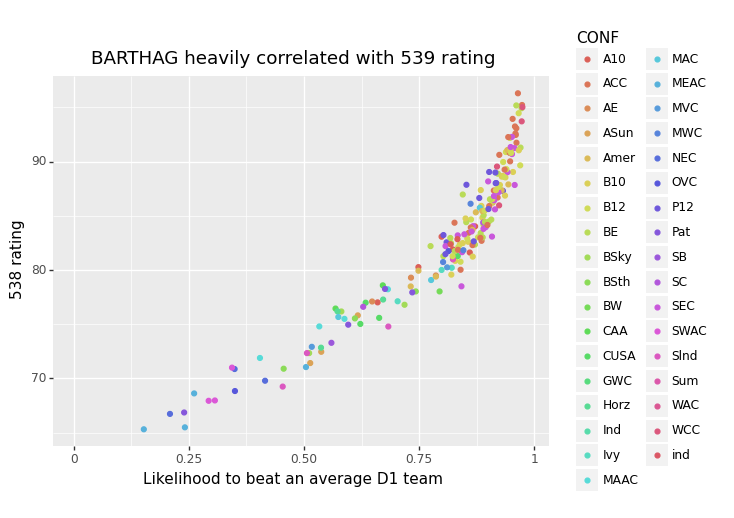

<ggplot: (8781986131755)>

In [22]:
# Viz 10
plot = pn.ggplot(data=cbb_df, mapping = pn.aes(x='BARTHAG',
                                              y = 'rating', color = 'CONF'))
plot = (plot +
        pn.geom_point() +
        pn.xlab('Likelihood to beat an average D1 team') +
        pn.ylab('538 rating') +
        pn.ggtitle('BARTHAG heavily correlated with 539 rating')      
)
plot

In this graph, I have the BARTHAG calculation, ie the likelihood of an individual team to beat an average D1 team. On the y axis, I have the rating of the team by 538, a source for NCAA news. I would like to further investigate these two metrics and see what confounding factors may be going into both of them. Additionally, this does not look like a linear function, rather an exponential relationship, meaning that the higher BARTHAG would significantly increase the rating of the team. 

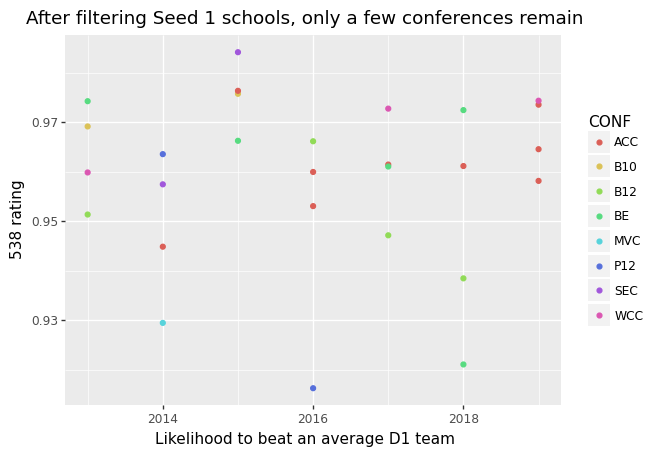

<ggplot: (8781986561277)>

In [23]:
# Viz 11
cbb_df_top_seed = cbb_df.loc[cbb_df['SEED'] == 1.0]
# cbb_df_top_seed

plot = pn.ggplot(data=cbb_df_top_seed, mapping = pn.aes(x='YEAR',
                                              y = 'BARTHAG', color = 'CONF'))
plot = (plot +
        pn.geom_point() +
        pn.xlab('Likelihood to beat an average D1 team') +
        pn.ylab('538 rating') +
        pn.ggtitle('After filtering Seed 1 schools, only a few conferences remain')      
)
plot

This chart is interesting for a few reasons. First, there is not much variable of the 538 ratings on seed 1 schools each year, with the highest being close to .99 and the lowest being a little less than .92. Additionally, the number of conferences that are represented have decreased as well. West Coast Conference appears consist over time as well as Big 12. I would like to take a look at more factors that the seed 1 schools of each year have in common, and potentially look at other data factors in the GBQ dataset. 

# 4. Data analysis (25%)

## Regression

In this regression model, I take a look at creating a model between the rating and the BARTHAG score. First, I look to see what the correlations look like between the target variables, SEED, rating, and BARTHAG. Then I create a simple linear regression model, and derive the statistics for that. It appears that there is an r squared value of 85%. This is pretty high, and in future analysis would want to identify any confounding variables, but for the time being, continued my analysis, with a visualization of this correlation. It appears to be slightly nonlinear, but a linear model appears to fit this correlation well. 

/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.


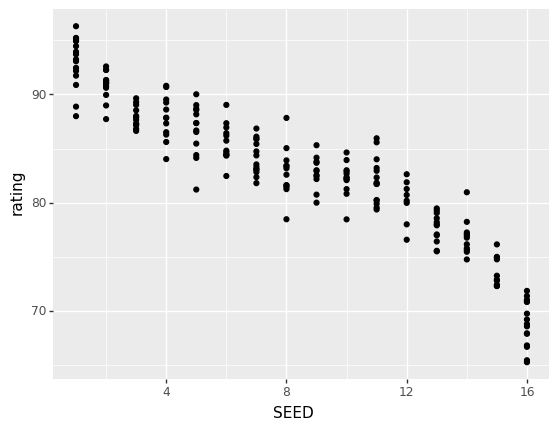

<ggplot: (8781986559781)>

In [24]:
(
    pn.ggplot(cbb_df,
              pn.aes(x = 'SEED',
                     y = 'rating'
                    )
             )
    + pn.geom_point()
)

/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.


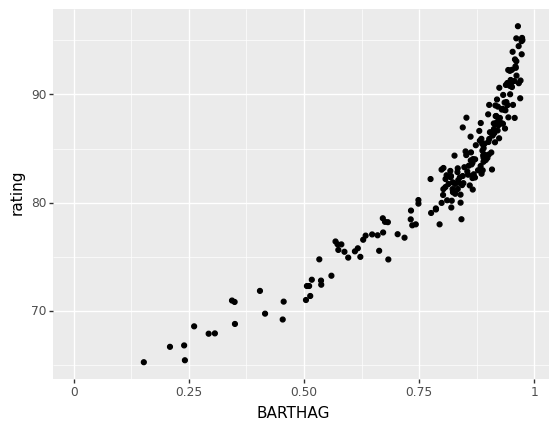

<ggplot: (8781985703503)>

In [25]:
(
    pn.ggplot(cbb_df,
              pn.aes(x = 'BARTHAG',
                     y = 'rating'
                    )
             )
    + pn.geom_point()
)

/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 1979 rows containing missing values.


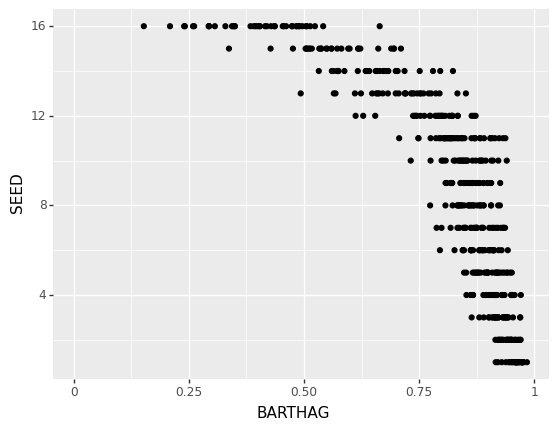

<ggplot: (8781985338468)>

In [26]:
(
    pn.ggplot(cbb_df,
              pn.aes(x = 'BARTHAG',
                     y = 'SEED'
                    )
             )
    + pn.geom_point()
)

In [27]:
y, X = patsy.dmatrices(
    'BARTHAG ~ rating', 
    data = cbb_df,
    return_type = 'dataframe'
)

In [28]:
y.head()

,BARTHAG
0,0.9531
2,0.9375
3,0.9696
4,0.9728
8,0.9736


In [29]:
X.head()

,Intercept,rating
0,1.0,93.94
2,1.0,88.54
3,1.0,89.65
4,1.0,93.71
8,1.0,95.22


In [30]:
lm_simple_model = sm.OLS(y, X)
lm_simple_fitted = lm_simple_model.fit()

In [31]:
lm_simple_fitted.bse
lm_simple_fitted.params
lm_simple_fitted.rsquared

Intercept    0.059251
rating       0.000712
dtype: float64

Intercept   -1.243850
rating       0.024659
dtype: float64

0.8589038136869189

In [32]:
lm_simple_fitted.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                BARTHAG   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.858
Method:                 Least Squares   F-statistic:                     1199.
Date:                Sat, 24 Dec 2022   Prob (F-statistic):           1.03e-85
Time:                        21:59:59   Log-Likelihood:                 256.88
No. Observations:                 199   AIC:                            -509.8
Df Residuals:                     197   BIC:                            -503.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -1.2439      0.059    -20.993      0.000      -1.361      -1.127
rating         0.0247      0.001     34.630      0.000       0.023       0.026
==============================================================================
Omnibus:                       18.988   Durbin-Watson:                   1.344
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               21.429
Skew:                          -0.774   Prob(JB):                     2.22e-05
Kurtosis:                       3.433   Cond. No.                     1.04e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.04e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [33]:
lm_simple_predictions_df = pd.concat(
    [cbb_df.BARTHAG, cbb_df.rating, lm_simple_fitted.get_prediction().summary_frame()], 
    axis = 1
)
lm_simple_predictions_df

,BARTHAG,rating,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,0.9531,93.94,1.072632,0.009155,1.054577,1.090687,0.939493,1.205771
1,0.9758,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.9375,88.54,0.939472,0.006195,0.927256,0.951689,0.806999,1.071946
3,0.9696,89.65,0.966844,0.006731,0.953571,0.980118,0.834269,1.099420
4,0.9728,93.71,1.066960,0.009016,1.049181,1.084740,0.933858,1.200063
5,0.9062,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,0.9522,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,0.9764,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,0.9736,95.22,1.104196,0.009946,1.084581,1.123811,0.970836,1.237556
9,0.9615,91.74,1.018382,0.007857,1.002887,1.033877,0.885565,1.151198


In [34]:
lm_simple_fitted.get_prediction().summary_frame() 

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,1.072632,0.009155,1.054577,1.090687,0.939493,1.205771
2,0.939472,0.006195,0.927256,0.951689,0.806999,1.071946
3,0.966844,0.006731,0.953571,0.980118,0.834269,1.099420
4,1.066960,0.009016,1.049181,1.084740,0.933858,1.200063
8,1.104196,0.009946,1.084581,1.123811,0.970836,1.237556
9,1.018382,0.007857,1.002887,1.033877,0.885565,1.151198
10,1.007285,0.007604,0.992289,1.022281,0.874526,1.140044
11,1.096798,0.009759,1.077552,1.116044,0.963492,1.230104
16,0.836397,0.004848,0.826837,0.845958,0.704142,0.968653
17,1.036136,0.008272,1.019824,1.052449,0.903222,1.169051


In [35]:
lm_simple_predictions = lm_simple_fitted.get_prediction()
lm_simple_predictions.summary_frame(alpha = .05)

,mean,mean_se,mean_ci_lower,mean_ci_upper,obs_ci_lower,obs_ci_upper
0,1.072632,0.009155,1.054577,1.090687,0.939493,1.205771
2,0.939472,0.006195,0.927256,0.951689,0.806999,1.071946
3,0.966844,0.006731,0.953571,0.980118,0.834269,1.099420
4,1.066960,0.009016,1.049181,1.084740,0.933858,1.200063
8,1.104196,0.009946,1.084581,1.123811,0.970836,1.237556
9,1.018382,0.007857,1.002887,1.033877,0.885565,1.151198
10,1.007285,0.007604,0.992289,1.022281,0.874526,1.140044
11,1.096798,0.009759,1.077552,1.116044,0.963492,1.230104
16,0.836397,0.004848,0.826837,0.845958,0.704142,0.968653
17,1.036136,0.008272,1.019824,1.052449,0.903222,1.169051


/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.
/opt/anaconda3/lib/python3.9/site-packages/plotnine/geoms/geom_path.py:75: PlotnineWarning: geom_path: Removed 2256 rows containing missing values.


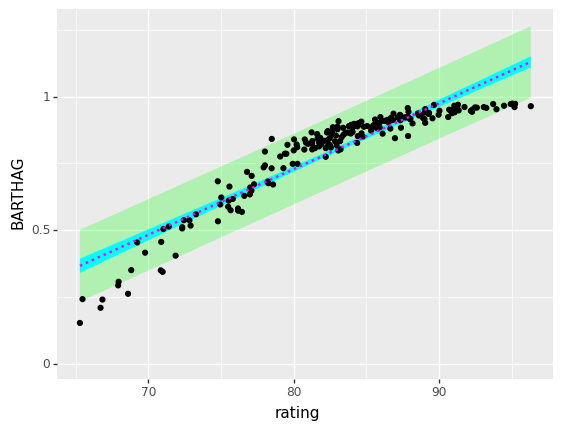

<ggplot: (8781987582100)>

In [36]:
(
    pn.ggplot(lm_simple_predictions_df,
              pn.aes(x = 'rating')
    )
    + pn.geom_ribbon(pn.aes(ymin = 'obs_ci_lower',
                           ymax = 'obs_ci_upper'), 
                    fill = 'lime',
                    alpha = .25)
     + pn.geom_ribbon(pn.aes(ymin = 'mean_ci_lower',
                           ymax = 'mean_ci_upper'), 
                    fill = 'cyan')
    + pn.geom_point(pn.aes(y = 'BARTHAG'))
    + pn.geom_line(pn.aes(y = 'mean'),
                  color = 'magenta',
                  size = 1,
                  linetype = 'dotted')
)

## Clustering Method 1

While regression provides some initial insights, the teams have several features that can be studied. Thus, a clustering model would better serve this data to identify any trends. This first clustering model is a bit more robust than the model we did in class (which is the second clustering model in this project). The reason for this is the inclusion of multiple variables to create its clusters. First, I removed the categorical variables, as well as the ratings that are not direct team statistics. Then I performed an elbow method to identify the correct number of clusters. It appears to be two, and checks out in the second clustering method I performed. I then visualized this below. 

In [37]:
#clustering method 1
cbb_df_cluster = cbb_df.drop(columns = ['TEAM', 'CONF', 'POSTSEASON', 'Season', 'YEAR', 'TeamID', 'TeamName', 'SEED', 'rating'])
cbb_df_cluster = cbb_df_cluster.dropna()

In [38]:
features = list(cbb_df_cluster.columns)

### Get the features data
data = cbb_df_cluster[features]

In [39]:
cbb_df_cluster

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB
0,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,18.2,40.7,30.0,32.3,30.4,53.9,44.6,32.7,36.2,71.7,8.6
1,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,15.8,32.1,23.7,36.2,22.4,54.8,44.7,36.5,37.5,59.3,11.3
2,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,19.5,25.5,24.9,30.7,30.0,54.7,46.8,35.2,33.2,65.9,6.9
3,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,22.8,27.4,28.7,32.9,36.6,52.8,41.9,36.5,29.7,67.5,7.0
4,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,17.1,30.0,26.2,39.0,26.9,56.3,40.0,38.2,29.0,71.5,7.7
5,40,29,117.2,96.2,0.9062,49.9,46.0,18.1,16.1,42.0,29.7,51.8,36.8,50.0,44.9,33.2,32.2,65.9,3.9
6,38,30,121.5,93.7,0.9522,54.6,48.0,14.6,18.7,32.5,29.4,28.4,22.7,53.4,47.6,37.9,32.6,64.8,6.2
7,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,18.6,35.8,30.2,39.8,23.9,55.9,46.3,38.7,31.4,66.4,10.7
8,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,17.5,30.4,25.4,29.1,26.3,52.5,45.7,39.5,28.9,60.7,11.1
9,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,18.6,41.3,25.0,34.3,31.6,51.0,46.3,35.5,33.9,72.8,8.4


In [40]:
Sum_of_squared_distances = []
K = range(1,10)
for num_clusters in K :
    kmeans = KMeans(n_clusters=num_clusters)
    kmeans.fit(cbb_df_cluster)
    Sum_of_squared_distances.append(kmeans.inertia_)


KMeans(n_clusters=1)

KMeans(n_clusters=2)

KMeans(n_clusters=3)

KMeans(n_clusters=4)

KMeans(n_clusters=5)

KMeans(n_clusters=6)

KMeans(n_clusters=7)

KMeans()

KMeans(n_clusters=9)

Text(0.5, 0, 'Values of K')

Text(0, 0.5, 'Sum of squared distances/Inertia')

Text(0.5, 1.0, 'Elbow Method For Optimal k')

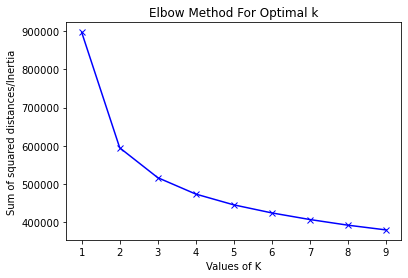

In [41]:
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

In [42]:
clustering_kmeans = KMeans(n_clusters= 2)
data['clusters'] = clustering_kmeans.fit_predict(data)

<AxesSubplot:xlabel='pca1', ylabel='pca2'>

Text(0.5, 1.0, 'K-means Clustering with 4 dimensions')

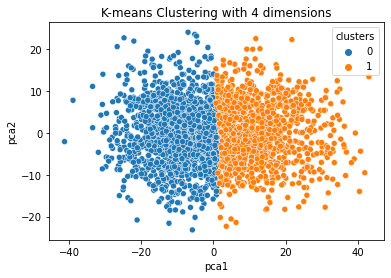

In [43]:
pca_num_components = 2

reduced_data = PCA(n_components=pca_num_components).fit_transform(data)
results = pd.DataFrame(reduced_data,columns=['pca1','pca2'])

sns.scatterplot(x="pca1", y="pca2", hue=data['clusters'], data=results)
plt.title('K-means Clustering with 4 dimensions')
plt.show()

In [44]:
cbb_df

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,Season,TeamID,TeamName,rating
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,18.2,40.7,30.0,32.3,30.4,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,2016.0,1314.0,North Carolina,93.94
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,15.8,32.1,23.7,36.2,22.4,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015,NaN,NaN,NaN,NaN
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,19.5,25.5,24.9,30.7,30.0,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018,2018.0,1276.0,Michigan,88.54
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,22.8,27.4,28.7,32.9,36.6,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019,2019.0,1403.0,Texas Tech,89.65
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,17.1,30.0,26.2,39.0,26.9,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017,2017.0,1211.0,Gonzaga,93.71
5,Kentucky,SEC,40,29,117.2,96.2,0.9062,49.9,46.0,18.1,16.1,42.0,29.7,51.8,36.8,50.0,44.9,33.2,32.2,65.9,3.9,2ND,8.0,2014,NaN,NaN,NaN,NaN
6,Michigan,B10,38,30,121.5,93.7,0.9522,54.6,48.0,14.6,18.7,32.5,29.4,28.4,22.7,53.4,47.6,37.9,32.6,64.8,6.2,2ND,4.0,2013,NaN,NaN,NaN,NaN
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,18.6,35.8,30.2,39.8,23.9,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,NaN,NaN,NaN,NaN
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,17.5,30.4,25.4,29.1,26.3,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,2019.0,1438.0,Virginia,95.22
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,18.6,41.3,25.0,34.3,31.6,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,2017.0,1314.0,North Carolina,91.74


## Clustering Method 2

The second clustering method I followed the process that we used in class. In this, I choose to use seed and BARTHAG to form these clusters. I randomly assigned two values and then calculated its deviance from the mean. From this, I found a similar breakup of clusters, in that performance appears to be the strongest breakup of the two. Further analysis could break up what exactly the features look like, and how they would change over time. But overall, this method corroborated my findings in the previous clustering method.

In [45]:
#clustering method 2
cbb_df_cluster_2 = cbb_df.assign(cluster_current = np.random.choice(['a', 'b'], size = len(cbb_df)))
#cbb_df

In [46]:
cbb_df_cluster_2

,TEAM,CONF,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,POSTSEASON,SEED,YEAR,Season,TeamID,TeamName,rating,cluster_current
0,North Carolina,ACC,40,33,123.3,94.9,0.9531,52.6,48.1,15.4,18.2,40.7,30.0,32.3,30.4,53.9,44.6,32.7,36.2,71.7,8.6,2ND,1.0,2016,2016.0,1314.0,North Carolina,93.94,b
1,Wisconsin,B10,40,36,129.1,93.6,0.9758,54.8,47.7,12.4,15.8,32.1,23.7,36.2,22.4,54.8,44.7,36.5,37.5,59.3,11.3,2ND,1.0,2015,NaN,NaN,NaN,NaN,a
2,Michigan,B10,40,33,114.4,90.4,0.9375,53.9,47.7,14.0,19.5,25.5,24.9,30.7,30.0,54.7,46.8,35.2,33.2,65.9,6.9,2ND,3.0,2018,2018.0,1276.0,Michigan,88.54,a
3,Texas Tech,B12,38,31,115.2,85.2,0.9696,53.5,43.0,17.7,22.8,27.4,28.7,32.9,36.6,52.8,41.9,36.5,29.7,67.5,7.0,2ND,3.0,2019,2019.0,1403.0,Texas Tech,89.65,a
4,Gonzaga,WCC,39,37,117.8,86.3,0.9728,56.6,41.1,16.2,17.1,30.0,26.2,39.0,26.9,56.3,40.0,38.2,29.0,71.5,7.7,2ND,1.0,2017,2017.0,1211.0,Gonzaga,93.71,a
5,Kentucky,SEC,40,29,117.2,96.2,0.9062,49.9,46.0,18.1,16.1,42.0,29.7,51.8,36.8,50.0,44.9,33.2,32.2,65.9,3.9,2ND,8.0,2014,NaN,NaN,NaN,NaN,a
6,Michigan,B10,38,30,121.5,93.7,0.9522,54.6,48.0,14.6,18.7,32.5,29.4,28.4,22.7,53.4,47.6,37.9,32.6,64.8,6.2,2ND,4.0,2013,NaN,NaN,NaN,NaN,b
7,Duke,ACC,39,35,125.2,90.6,0.9764,56.6,46.5,16.3,18.6,35.8,30.2,39.8,23.9,55.9,46.3,38.7,31.4,66.4,10.7,Champions,1.0,2015,NaN,NaN,NaN,NaN,b
8,Virginia,ACC,38,35,123.0,89.9,0.9736,55.2,44.7,14.7,17.5,30.4,25.4,29.1,26.3,52.5,45.7,39.5,28.9,60.7,11.1,Champions,1.0,2019,2019.0,1438.0,Virginia,95.22,a
9,North Carolina,ACC,39,33,121.0,91.5,0.9615,51.7,48.1,16.2,18.6,41.3,25.0,34.3,31.6,51.0,46.3,35.5,33.9,72.8,8.4,Champions,1.0,2017,2017.0,1314.0,North Carolina,91.74,a


In [47]:
means_current = cbb_df_cluster_2.groupby('cluster_current').mean()
means_current

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,YEAR,Season,TeamID,rating
cluster_current,,,,,,,,,,,,,,,,,,,,,,,,
a,31.470732,16.212195,103.291138,103.260325,0.494494,49.757886,49.963821,18.799512,18.676992,30.040000,30.128130,36.044065,36.274959,48.760976,48.949593,34.386585,34.563252,67.739593,-7.786667,8.846774,2015.993496,2017.421053,1300.938596,83.048947
b,31.514286,16.356735,103.317878,103.349061,0.493419,49.852571,50.039102,18.726449,18.702204,29.710612,30.022612,35.935265,36.264980,48.843755,49.003837,34.426286,34.634367,67.885306,-7.818367,8.754386,2016.021224,2017.482353,1284.976471,82.797294


/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 1979 rows containing missing values.


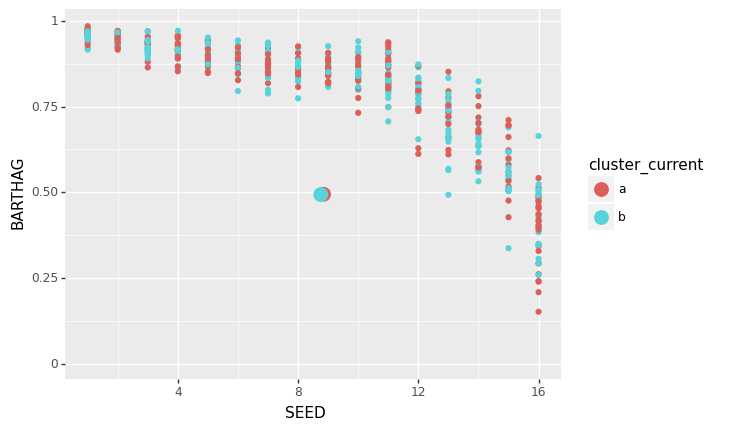

<ggplot: (8781986953400)>

In [48]:
(
    pn.ggplot(cbb_df_cluster_2,
              pn.aes(x = 'SEED',
                     y = 'BARTHAG',
                     color = 'cluster_current'
                    )
             )
    + pn.geom_point()
    + pn.geom_point(data = means_current.reset_index(),
                    size = 5,
                    #shape = 'SEED'
                   )
)

In [49]:
cbb_df_cluster_2 = cbb_df_cluster_2.assign(
    distance_from_current_mean_a = np.sqrt(
        (cbb_df_cluster_2['SEED'] - means_current.loc['a', 'SEED']) ** 2 +
        (cbb_df_cluster_2['BARTHAG'] - means_current.loc['a', 'BARTHAG']) ** 2
    ),
    distance_from_current_mean_b = np.sqrt(
        (cbb_df_cluster_2['SEED'] - means_current.loc['b', 'SEED']) ** 2 +
        (cbb_df_cluster_2['BARTHAG'] - means_current.loc['b', 'BARTHAG']) ** 2
    )
)

In [50]:
cbb_df_cluster_2.cluster_current[
    cbb_df_cluster_2.distance_from_current_mean_a < cbb_df_cluster_2.distance_from_current_mean_b
] = 'a'
cbb_df_cluster_2.cluster_current[
    cbb_df_cluster_2.distance_from_current_mean_b < cbb_df_cluster_2.distance_from_current_mean_a
] = 'b'


/var/folders/75/71sbjnn93ts9h5tw6sn9zkhc0000gn/T/ipykernel_5386/4102057751.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/75/71sbjnn93ts9h5tw6sn9zkhc0000gn/T/ipykernel_5386/4102057751.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 1979 rows containing missing values.


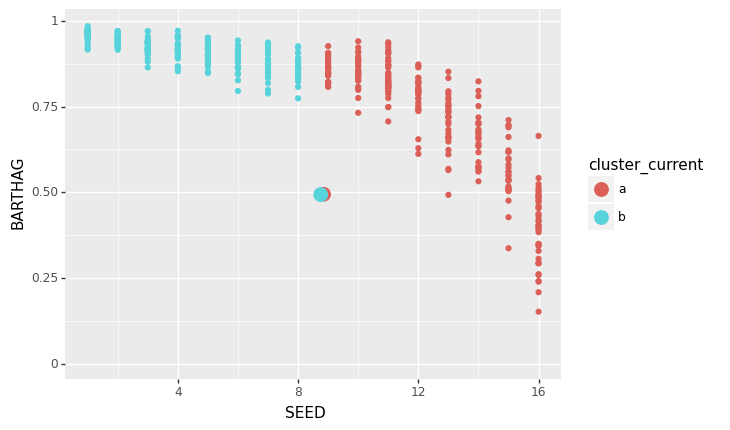

<ggplot: (8781954892011)>

In [51]:
(
    pn.ggplot(cbb_df_cluster_2,
              pn.aes(x = 'SEED',
                     y = 'BARTHAG',
                     color = 'cluster_current'
                    )
             )
    + pn.geom_point()
    + pn.geom_point(data = means_current.reset_index(),
                    size = 5,
                    #shape = 'x'
                   )
)

In [52]:
means_current = cbb_df_cluster_2.groupby('cluster_current').mean()
means_current

,G,W,ADJOE,ADJDE,BARTHAG,EFG_O,EFG_D,TOR,TORD,ORB,DRB,FTR,FTRD,2P_O,2P_D,3P_O,3P_D,ADJ_T,WAB,SEED,YEAR,Season,TeamID,rating,distance_from_current_mean_a,distance_from_current_mean_b
cluster_current,,,,,,,,,,,,,,,,,,,,,,,,,,
a,31.253647,15.841167,102.640762,103.830146,0.475326,49.710697,50.112318,18.856564,18.693679,29.796191,30.166288,36.139384,36.526742,48.713695,49.137844,34.352026,34.613614,67.775284,-8.447245,12.630952,2015.970016,2017.436170,1295.223404,77.726277,3.823723,3.910444
b,31.733825,16.732187,103.975266,102.773464,0.512787,49.900573,49.889271,18.668550,18.685422,29.955938,29.983702,35.838575,36.010483,48.891810,48.813759,34.461343,34.583702,67.849713,-7.150860,4.495536,2016.045045,2017.457143,1293.133333,87.610286,4.379600,4.288979


/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.


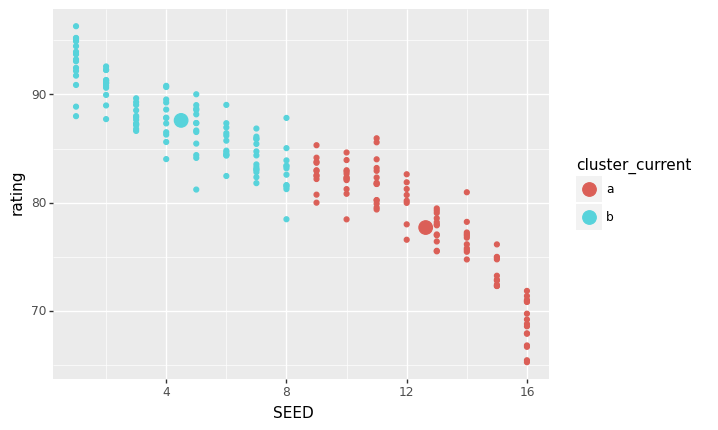

<ggplot: (8781954887178)>

In [53]:
(
    pn.ggplot(cbb_df_cluster_2,
              pn.aes(x = 'SEED',
                     y = 'rating',
                     color = 'cluster_current'
                    )
             )
    + pn.geom_point()
    + pn.geom_point(data = means_current.reset_index(),
                    size = 5,
                    #shape = 'x'
                   )
)

In [54]:
cbb_df_cluster_2 = cbb_df_cluster_2.assign(
    distance_from_current_mean_a = np.sqrt(
        (cbb_df_cluster_2['SEED'] - means_current.loc['a', 'SEED']) ** 2 +
        (cbb_df_cluster_2['rating'] - means_current.loc['a', 'rating']) ** 2
    ),
    distance_from_current_mean_b = np.sqrt(
        (cbb_df_cluster_2['SEED'] - means_current.loc['b', 'SEED']) ** 2 +
        (cbb_df_cluster_2['rating'] - means_current.loc['b', 'rating']) ** 2
    )
)


In [55]:
cbb_df_cluster_2.cluster_current[
    cbb_df_cluster_2.distance_from_current_mean_a < cbb_df_cluster_2.distance_from_current_mean_b
] = 'a'
cbb_df_cluster_2.cluster_current[
    cbb_df_cluster_2.distance_from_current_mean_b < cbb_df_cluster_2.distance_from_current_mean_a
] = 'b'

/var/folders/75/71sbjnn93ts9h5tw6sn9zkhc0000gn/T/ipykernel_5386/2629253088.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/var/folders/75/71sbjnn93ts9h5tw6sn9zkhc0000gn/T/ipykernel_5386/2629253088.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


/opt/anaconda3/lib/python3.9/site-packages/plotnine/layer.py:411: PlotnineWarning: geom_point : Removed 2256 rows containing missing values.


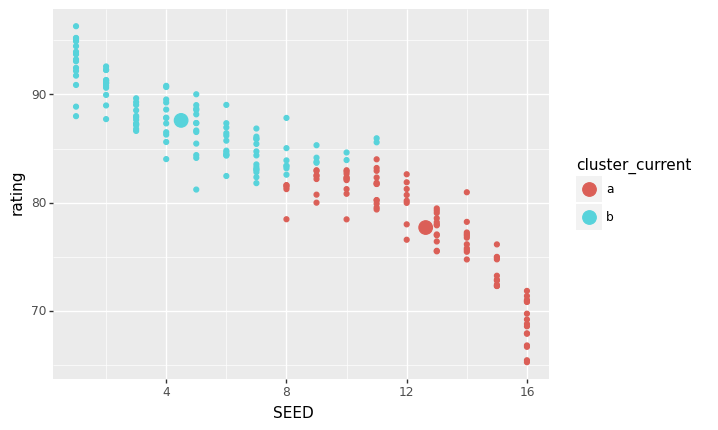

<ggplot: (8781955212201)>

In [56]:
(
    pn.ggplot(cbb_df_cluster_2,
              pn.aes(x = 'SEED',
                     y = 'rating',
                     color = 'cluster_current'
                    )
             )
    + pn.geom_point()
    + pn.geom_point(data = means_current.reset_index(),
                    size = 5,
                    #shape = 'x'
                   )
)

# 5. Next steps (20%)

**A. What benefits do you anticipate for your stakeholders?**

The first benefit would be to uncover new ways of modeling this robust data that the different NCAA teams have. While much of this sport relies on qualitative metrics, quantifying them in some way would cut down on playbacks, and any discrepancies and hard to calculate plays and scores. The second benefit would be a better way to choose its players and assess its competition. Much like Billy Bean in baseball, by looking at play by play as well as team statistics, you can better understand how each player is contributing with their respective strenghts. Similarly, before facing an opponent, access to their data could be crucial in understanding what plays to play against them for a better competitive edge. 

**B. What are the resources required? How will those resources be allocated?**
- **a. Your time costs, in full-time-equivalent (FTE) months?**
The time costs for this, while at first might be high, will overtime decrease. For the first few months of aquiring this data it will be time consuming to process it all and become familiar with it. However, as mentioned above, it will reduce much of the manpower that is currently associated with this process. For FTE equivalent months, it would be anywhere from 6 months to a year to set this up. This would then have to be updated every season from November to April. 
- **b. Total human annotation costs, annotator FTE months and monthly wage**
This should not be too expensive, in that the data scientists in charge of formulating this data will do a majority of the analysis that goes along with it. Transforming this data into readable, presentable information will simply be part of the task. 
- **c. Total engineering costs, professional programmer FTE months and wage**
This will be where the bulk of the cost lies. Two data scientists/engineers would most likely be needed at least, to maintain the computations created and refresh the models as necessary with new data values. Data Science salaries can be anywhere from 60,000 dollars per year - 200,000 dollars per year depending on their background and what additionally they can be bringing to the table.
- **d. Additional monetary costs (e.g., data purchase)**
Utilizing the entirity of the google big query data set will cost money over time. Moreover, collecting this data as a separate entity will be very expensive. Thinking about how to best collect this data, either through manual collection or computer generated collection based on broadcasting. Either way, it will be computational expensive, and will need money to be backing this venture up to provide the most specific and relevant data. 
- **e. If nontrivial: total storage (GB), RAM (GB), computation (core-hours)**
Especially when using the big data sets like google big query data, this kind of storage will need a lot to process. Anywhere from 100-200 GB of information would be collected almost every year, especially as plays get more granular. Alas, storage will be fairly expensive and stakeholders could invest in cloud computing for storage of this data.


**C. What are the data inputs for this ideal analysis?**

The best and most ideal data inputs would be the play by play data throughout the season, each year, with player and game statistics, as well as aggregated team data. Play by play data will give information about each game, that can be analyzed on a week to week basis. As the season wraps up, team based statistics will give an idea of what the team as a whole is performing like compared to other teams. With both, you get a micro and macro level of the entire season, and can run as small or as large of an analysis as necessary to compute.


**D. What is the planned output for this ideal analysis? Be as specific as possible.**

The planned output would be sophisiticated models and visualizations of this data. First, a regression model understanding the importance of each of the different metrics to assess the team will give a better understanding of how the team is performing. Quick and easy visualizations by player and by game on the number of turnovers, assists, and other key metrics will give an idea of how the team is performing on a micro level. Lastly, for stakeholders besides the team itself, a clustering model that is updated throughout the season would give better insight on how to build a March Madness bracket given the factors that are most common in different teams. 


**E. What is your strategy for transforming inputs into outputs? Be as specific as possible.**

Utilizing this project as a first step, setting up a clustering model, a regression model and perhaps even more involved machine learning models coupled with data visualizations will help easily incorporate new inputs to make this analysis better. First, taking in the the new data and cleaning it as it comes can help smoothly process this data. Second, utilizing a method of inclusion to refresh the data maybe every two weeks during the season to better tune the model to present day on how to better perform. Lastly, taking the new data to refresh the visualizations, perhaps on something like a Tableau dashboard, will keep all of the information easy to read and up to date. Utilizing platforms like Alteryx would also be a convenient next step. If teams are looking to pull data from multiple sources, using a platform like that will smooth out the process of going from inputs to outputs.

**F. What problems do you anticipate? What are your plans for addressing them?**

First, access issues as this data becomes more readily available will be a big issue going forward. To address this, I hope to encourage teams to collect this data on their own and sell it to platforms for fans and other stakeholders to use. Second, I think there are limitations to what data can predict. In each analysis, being upfront about its limitations will ensure that the findings from these analyses do not outweigh other forms of data collection. 